# Optimized Multimodal Diabetic Retinopathy Classification using PyTorch & EfficientNet-B4

This optimized Jupyter Notebook provides an offline-preprocessing pipeline for **Multimodal Diabetic Retinopathy (DR) Classification**. Preprocessing images once before training significantly speeds up training epochs by eliminating repetitive disk I/O and GPU/CPU bottlenecking during batch loading.

### Optimization Workflow:
1. **Offline Image Preprocessing**: Scans `clinical_data.csv`, runs border removal, center-focused crop, circular masking, LAB-space CLAHE enhancement, resizes to 224x224, and saves the output to `processed_images/` class subfolders. Skipped if already processed.
2. **Processed Dataset CSV Generation**: Generates `clinical_data_processed.csv` referencing the pre-processed images.
3. **Simplified PyTorch Dataset**: Loads preprocessed 224x224 JPEGs instantly, applying only lightweight regularizing augmentations (flips, rotations, random erasing, normalization) during training.
4. **Image Backbone & Fusion Classifier**: Loads a trained EfficientNet-B4 checkpoint (initially frozen) and combines it with a tabular Clinical MLP Encoder into a Fusion Classification head.
5. **Inference & Grad-CAM++ Interpretability**: Retains dynamic, on-the-fly preprocessing for single-patient testing with saliency map visual overlays.

### 1. Imports and Setup

In [1]:
import os
import random
import time
import numpy as np
import pandas as pd
import cv2
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torchvision.transforms import Compose, Resize, CenterCrop, RandomHorizontalFlip, RandomVerticalFlip, RandomRotation, ToTensor, Normalize
from sklearn.metrics import classification_report, confusion_matrix, cohen_kappa_score, precision_recall_fscore_support
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

PyTorch version: 2.11.0+cu128
CUDA available: True


### 2. Configuration

In [2]:
class Config:
    SEED = 42
    NUM_CLASSES = 5
    BATCH_SIZE = 16
    LEARNING_RATE = 1e-4
    EPOCHS = 15
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    IMAGE_SIZE = 224
    
    # Paths
    RAW_CLINICAL_CSV_PATH = r"D:\Diabetic Retinopathy Prediction\data\clinical_data.csv"
    PROCESSED_CLINICAL_CSV_PATH = r"D:\Diabetic Retinopathy Prediction\data\clinical_data_processed.csv"
    PROCESSED_IMAGE_DIR = r"D:\Diabetic Retinopathy Prediction\processed_images"
    
    IMAGE_CHECKPOINT_PATH = r"D:\Diabetic Retinopathy Prediction\Models\best_model.pth"
    MULTIMODAL_SAVE_PATH = r"D:\Diabetic Retinopathy Prediction\Models\best_multimodal_model.pth"

def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(Config.SEED)
print(f"Executing on Device: {Config.DEVICE}")

Executing on Device: cuda


### 3. Image Preprocessing Helpers

In [3]:
def remove_black_borders(img, tolerance=10):
    """
    Crops the image to the bounding box of the active circular retinal scan.
    """
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, tolerance, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) > 0:
        c = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(c)
        return img[y:y+h, x:x+w]
    return img

def preprocess_image_array(img, image_size=224):
    """
    Core image preprocessing steps: border removal, center-focused crop, 
    circular mask, LAB-space CLAHE enhancement, and resizing.
    """
    # 1. Remove black borders
    img = remove_black_borders(img)
    h, w, _ = img.shape
    
    # 2. Center-focused crop (constant scale = 0.75 for validation / preprocessing)
    crop_scale = 0.75
    new_h, new_w = int(h * crop_scale), int(w * crop_scale)
    
    center_x, center_y = w // 2, h // 2
    x1 = max(0, center_x - new_w // 2)
    y1 = max(0, center_y - new_h // 2)
    x2 = min(w, x1 + new_w)
    y2 = min(h, y1 + new_h)
    img = img[y1:y2, x1:x2]
    
    # 3. Circular mask
    ch, cw, _ = img.shape
    mask = np.zeros((ch, cw), dtype=np.uint8)
    cv2.circle(mask, (cw // 2, ch // 2), int(0.49 * min(ch, cw)), 255, -1)
    img = cv2.bitwise_and(img, img, mask=mask)
    
    # 4. CLAHE in LAB space
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    l = clahe.apply(l)
    img = cv2.merge((l, a, b))
    img = cv2.cvtColor(img, cv2.COLOR_LAB2BGR)
    
    # 5. Resize
    img_resized = cv2.resize(img, (image_size, image_size))
    return img_resized

def preprocess_single_image(img_path, output_path, image_size=224):
    """
    Loads raw image, applies preprocess_image_array and saves it.
    """
    img = cv2.imread(img_path)
    if img is None:
        return False
    
    img_resized = preprocess_image_array(img, image_size)
    cv2.imwrite(output_path, img_resized, [int(cv2.IMWRITE_JPEG_QUALITY), 95])
    return True

### 4. Run Offline Preprocessing

We loop through the clinical data CSV, check if the processed image already exists, and if not, run the preprocessor. A new CSV is written to point directly to these preprocessed JPEGs.

In [4]:
def preprocess_dataset(raw_csv, processed_csv, processed_dir, image_size=224):
    if not os.path.exists(raw_csv):
        raise FileNotFoundError(f"Raw clinical CSV not found at {raw_csv}")
        
    df = pd.read_csv(raw_csv)
    os.makedirs(processed_dir, exist_ok=True)
    
    # Create subfolders for each DR Grade (0,1,2,3,4)
    for i in range(5):
        os.makedirs(os.path.join(processed_dir, str(i)), exist_ok=True)
        
    processed_paths = []
    processed_count = 0
    skipped_count = 0
    failed_log = []
    
    print("Starting offline image preprocessing...")
    for idx, row in tqdm(df.iterrows(), total=len(df)):
        raw_path = row['Image_Path']
        image_name = os.path.basename(raw_path)
        grade = str(row['DR_Grade'])
        
        # Maintain class folder structure
        dest_path = os.path.join(processed_dir, grade, image_name)
        processed_paths.append(dest_path)
        
        # Check if already processed
        if os.path.exists(dest_path):
            skipped_count += 1
            continue
            
        success = preprocess_single_image(raw_path, dest_path, image_size)
        if success:
            processed_count += 1
        else:
            failed_log.append(raw_path)
            # Fallback to destination if failed, but keep catalogued
            
    print(f"\nPreprocessing Completed!")
    print(f"Processed: {processed_count} images")
    print(f"Skipped (already exist): {skipped_count} images")
    if len(failed_log) > 0:
        print(f"WARNING: Failed to process {len(failed_log)} images. Check raw paths.")
        
    # Update dataframe paths and save new CSV
    df['Image_Path'] = processed_paths
    df.to_csv(processed_csv, index=False)
    print(f"Saved updated clinical data CSV to: {processed_csv}")

preprocess_dataset(Config.RAW_CLINICAL_CSV_PATH, Config.PROCESSED_CLINICAL_CSV_PATH, Config.PROCESSED_IMAGE_DIR, Config.IMAGE_SIZE)

Starting offline image preprocessing...


100%|██████████| 108227/108227 [16:54<00:00, 106.69it/s]



Preprocessing Completed!
Processed: 94775 images
Skipped (already exist): 13452 images
Saved updated clinical data CSV to: D:\Diabetic Retinopathy Prediction\data\clinical_data_processed.csv


### 5. Load & Normalize Tabular Clinical Data

We load the newly generated `clinical_data_processed.csv` and transform clinical tabular fields.

In [5]:
# 1. Load the processed clinical dataframe
clinical_df = pd.read_csv(Config.PROCESSED_CLINICAL_CSV_PATH)

# 2. Perform train_test_split() immediately after loading using stratified sampling
train_df, val_df = train_test_split(
    clinical_df,
    test_size=0.2,
    random_state=Config.SEED,
    stratify=clinical_df['DR_Grade']
)
# Avoid SettingWithCopyWarning
train_df = train_df.copy()
val_df = val_df.copy()

# 3. Ensure no image overlap between train and validation and print the overlap count
train_images = set(train_df['Image_Path'])
val_images = set(val_df['Image_Path'])
overlap_count = len(train_images.intersection(val_images))
print(f"Image overlap count between train and validation sets: {overlap_count}")
assert overlap_count == 0, "Error: Overlap detected between train and validation sets!"

# 4. Compute feature correlations only on the training set
print("\nFeature correlations with DR_Grade (Training Set):")
correlations = train_df.corr(numeric_only=True)["DR_Grade"]
print(correlations.sort_values(ascending=False))

# 5. Define categorical, numerical, and clinical_feature_cols in sequence
categorical_cols = [col for col in ['Gender', 'Smoking_Status', 'Hypertension', 'Family_History'] if col in clinical_df.columns]
numerical_cols = [col for col in [
    'Age', 'Duration_DM_Years', 'HbA1c', 'Fasting_Glucose_mg_dL', 'BMI',
    'Systolic_BP', 'Diastolic_BP', 'Total_Cholesterol_mg_dL', 'Serum_Creatinine_mg_dL'
] if col in clinical_df.columns]
clinical_feature_cols = categorical_cols + numerical_cols

# 6. Fit preprocessing objects only on training set and apply transform to validation set
# Imputation
for col in categorical_cols:
    train_mode = train_df[col].mode()[0] if not train_df[col].empty else 'Never'
    train_df[col] = train_df[col].fillna(train_mode)
    val_df[col] = val_df[col].fillna(train_mode)

for col in numerical_cols:
    train_median = train_df[col].median() if not train_df[col].empty else 0.0
    train_df[col] = train_df[col].fillna(train_median)
    val_df[col] = val_df[col].fillna(train_median)

# Encoding Categorical Features
clinical_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    train_df[col] = le.fit_transform(train_df[col].astype(str))
    # Map unseen categories in validation set safely
    val_df[col] = val_df[col].astype(str).map(lambda s: le.transform([s])[0] if s in le.classes_ else 0)
    clinical_encoders[col] = le

# Normalizing Numerical Features
clinical_scaler = StandardScaler()
if len(numerical_cols) > 0:
    train_df[numerical_cols] = clinical_scaler.fit_transform(train_df[numerical_cols])
    val_df[numerical_cols] = clinical_scaler.transform(val_df[numerical_cols])

print(f"\nProcessed {len(clinical_feature_cols)} clinical features: {clinical_feature_cols}")

Image overlap count between train and validation sets: 0

Feature correlations with DR_Grade (Training Set):
DR_Grade                   1.000000
Duration_DM_Years          0.252124
HbA1c                      0.127731
Serum_Creatinine_mg_dL     0.118640
Fasting_Glucose_mg_dL      0.065671
Total_Cholesterol_mg_dL    0.045309
Age                        0.005261
Diastolic_BP               0.003737
Systolic_BP                0.001929
BMI                       -0.002580
Name: DR_Grade, dtype: float64

Processed 12 clinical features: ['Gender', 'Smoking_Status', 'Hypertension', 'Age', 'Duration_DM_Years', 'HbA1c', 'Fasting_Glucose_mg_dL', 'BMI', 'Systolic_BP', 'Diastolic_BP', 'Total_Cholesterol_mg_dL', 'Serum_Creatinine_mg_dL']


### 6. Optimized Multimodal Dataset Class

Since the images inside `processed_images` are already cropped, masked, contrast-enhanced, and resized to 224x224, the dataset class simply loads the files directly and applies training/validation transforms.

In [6]:
class OptimizedMultimodalDataset(Dataset):
    def __init__(self, df, clinical_features, transforms=None, is_train=True):
        self.df = df.reset_index(drop=True)
        self.clinical_features = clinical_features
        self.transforms = transforms
        self.is_train = is_train

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = row['Image_Path']
        
        # Load preprocessed JPEG image directly using PIL
        try:
            img_pil = Image.open(img_path).convert('RGB')
        except Exception as e:
            # Fallback to placeholder image in case of missing files
            img_pil = Image.new("RGB", (224, 224), (0, 0, 0))
            
        if self.transforms:
            img_tensor = self.transforms(img_pil)
        else:
            img_tensor = ToTensor()(img_pil)
            
        # Lightweight Tensor-level Random Erasing augmentation during training
        if self.is_train and random.random() < 0.5:
            c_chan, th, tw = img_tensor.shape
            ph, pw = int(0.2 * th), int(0.2 * tw)
            y_offset = random.randint(0, th - ph)
            x_offset = random.randint(0, tw - pw)
            
            mask_tensor = torch.ones((c_chan, th, tw), dtype=img_tensor.dtype)
            mask_tensor[:, y_offset:y_offset+ph, x_offset:x_offset+pw] = 0.0
            img_tensor = img_tensor * mask_tensor
            
        # Load Clinical features
        clinical_vals = row[self.clinical_features].values.astype(np.float32)
        clinical_tensor = torch.tensor(clinical_vals, dtype=torch.float32)
        
        # Get target class
        label = int(row['DR_Grade'])
        
        return img_tensor, clinical_tensor, label

### 7. Splitting and DataLoader Setup

We keep only lightweight transforms during training: `RandomHorizontalFlip`, `RandomVerticalFlip`, `RandomRotation`, tensor-level `RandomErasing`, and `Normalize`.

In [7]:
train_transforms = Compose([
    RandomHorizontalFlip(p=0.5),
    RandomVerticalFlip(p=0.5),
    RandomRotation(degrees=20),
    ToTensor(),
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transforms = Compose([
    ToTensor(),
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = OptimizedMultimodalDataset(train_df, clinical_feature_cols, train_transforms, is_train=True)
val_dataset = OptimizedMultimodalDataset(val_df, clinical_feature_cols, val_transforms, is_train=False)

train_loader = DataLoader(
    train_dataset,
    batch_size=Config.BATCH_SIZE,
    shuffle=True,
    drop_last=True,
    num_workers=0,
    pin_memory=torch.cuda.is_available()
)

val_loader = DataLoader(
    val_dataset,
    batch_size=Config.BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    pin_memory=torch.cuda.is_available()
)

print(f"Train samples: {len(train_dataset)}, Validation samples: {len(val_dataset)}")

Train samples: 86581, Validation samples: 21646


### 8. Multimodal Classifier Network Model

In [8]:
# ==========================================================
# 8. Multimodal Classifier Network Model
# ==========================================================

class MultimodalDRClassifier(nn.Module):
    def __init__(
        self,
        num_clinical_features,
        num_classes=5,
        image_checkpoint=None
    ):
        super(MultimodalDRClassifier, self).__init__()

        # --------------------------------------------------
        # 1. Image Feature Extractor - EfficientNet-B4
        # --------------------------------------------------
        self.image_model = models.efficientnet_b4(weights=None)

        in_features = self.image_model.classifier[1].in_features

        # Create same classifier structure used by image model
        # checkpoint
        self.image_model.classifier = nn.Sequential(
            nn.Dropout(p=0.4, inplace=False),
            nn.Linear(in_features, 512),
            nn.ReLU(inplace=False),
            nn.Dropout(p=0.3, inplace=False),
            nn.Linear(512, num_classes)
        )

        # --------------------------------------------------
        # Load trained EfficientNet-B4 checkpoint
        # --------------------------------------------------
        if image_checkpoint and os.path.exists(image_checkpoint):

            state_dict = torch.load(
                image_checkpoint,
                map_location="cpu"
            )

            self.image_model.load_state_dict(state_dict)

            print(
                f"Successfully loaded EfficientNet-B4 "
                f"checkpoint from: {image_checkpoint}"
            )

        else:
            print(
                "WARNING: No valid image checkpoint found. "
                "EfficientNet is using randomized weights."
            )

        # --------------------------------------------------
        # Remove final DR classification layer
        # Output becomes 512-dimensional image features
        # --------------------------------------------------
        self.image_model.classifier = nn.Sequential(
            *list(self.image_model.classifier[:-1])
        )

        # --------------------------------------------------
        # Disable inplace activations
        # Prevent backward gradient modification errors
        # --------------------------------------------------
        for module in self.image_model.modules():
            if isinstance(module, (nn.ReLU, nn.SiLU)):
                module.inplace = False

        # --------------------------------------------------
        # Freeze complete EfficientNet first
        # --------------------------------------------------
        for param in self.image_model.parameters():
            param.requires_grad = False

        # --------------------------------------------------
        # Unfreeze ONLY final EfficientNet feature block
        # Low GPU load + limited fine-tuning
        # --------------------------------------------------
        for param in self.image_model.features[-1].parameters():
            param.requires_grad = True

        # --------------------------------------------------
        # Keep 512-dimensional projection head trainable
        # --------------------------------------------------
        for param in self.image_model.classifier.parameters():
            param.requires_grad = True

        # --------------------------------------------------
        # 2. Clinical Data MLP Encoder
        # --------------------------------------------------
        self.clinical_encoder = nn.Sequential(
            nn.Linear(num_clinical_features, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(inplace=False),
            nn.Dropout(p=0.2),

            nn.Linear(64, 32),
            nn.ReLU(inplace=False)
        )

        # --------------------------------------------------
        # 3. Multimodal Fusion Classification Head
        # Image features = 512
        # Clinical features = 32
        # Total fused features = 544
        # --------------------------------------------------
        self.fusion_classifier = nn.Sequential(
            nn.Linear(512 + 32, 128),
            nn.ReLU(inplace=False),
            nn.Dropout(p=0.3),
            nn.Linear(128, num_classes)
        )

    def forward(self, image_tensor, clinical_tensor):

        # Extract 512-dimensional image features
        img_feats = self.image_model(image_tensor)

        # Extract 32-dimensional clinical features
        clin_feats = self.clinical_encoder(clinical_tensor)

        # Fuse image + clinical features
        fused = torch.cat(
            (img_feats, clin_feats),
            dim=1
        )

        # Final DR grade prediction
        output = self.fusion_classifier(fused)

        return output


# ==========================================================
# Initialize Multimodal Model
# ==========================================================

model = MultimodalDRClassifier(
    num_clinical_features=len(clinical_feature_cols),
    num_classes=Config.NUM_CLASSES,
    image_checkpoint=Config.IMAGE_CHECKPOINT_PATH
)

model = model.to(Config.DEVICE)

# ==========================================================
# Verify trainable parameters
# ==========================================================

trainable_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

total_params = sum(
    p.numel()
    for p in model.parameters()
)

print("Optimized multimodal model successfully initialized.")
print(f"Device: {Config.DEVICE}")
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(
    f"Trainable percentage: "
    f"{100 * trainable_params / total_params:.2f}%"
)

Successfully loaded EfficientNet-B4 checkpoint from: D:\Diabetic Retinopathy Prediction\Models\best_model.pth
Optimized multimodal model successfully initialized.
Device: cuda
Total parameters: 18,540,077
Trainable parameters: 1,797,861
Trainable percentage: 9.70%


### 9. Optimization parameters, loss & early stopping utilities

In [9]:
# Compute class weights to handle dataset imbalances
class_counts = train_df['DR_Grade'].value_counts().sort_index().values
class_weights = 1.0 / class_counts
class_weights = class_weights / np.sum(class_weights) * Config.NUM_CLASSES
class_weights_tensor = torch.FloatTensor(class_weights).to(Config.DEVICE)

criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(model.parameters(), lr=Config.LEARNING_RATE)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2)
USE_AMP = Config.DEVICE.type == "cuda"
scaler = torch.amp.GradScaler("cuda", enabled=USE_AMP)

class EarlyStopping:
    def __init__(self, patience=5, min_delta=0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False
        
    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss > self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_loss = val_loss
            self.counter = 0
        return self.early_stop

### 10. Training and Validation loops

In [10]:
def train_epoch(model, loader, criterion, optimizer, scaler, device):
    model.train()
    total_loss = 0.0
    correct = 0
    total = 0

    for batch_idx, (imgs, clins, labels) in enumerate(loader):
        print(
            f"\rTraining batch {batch_idx + 1}/{len(loader)}",
            end="",
            flush=True
        )

        imgs = imgs.to(device, non_blocking=True)
        clins = clins.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with torch.amp.autocast(
            device_type=device.type,
            enabled=USE_AMP
        ):
            outputs = model(imgs, clins)
            loss = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(optimizer)
        scaler.update()

        total_loss += loss.item() * imgs.size(0)
        predicted = outputs.argmax(dim=1)

        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    print()

    return total_loss / total, correct / total

def validate(model, loader, criterion, device):
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for imgs, clins, labels in loader:
            imgs, clins, labels = imgs.to(device), clins.to(device), labels.to(device)
            outputs = model(imgs, clins)
            loss = criterion(outputs, labels)
            
            total_loss += loss.item() * imgs.size(0)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
            
    return total_loss / total, correct / total

### 11. Run Model Training Loop

In [11]:
early_stop = EarlyStopping(patience=5)
best_val_loss = float('inf')

print("Starting optimized training loop...")
for epoch in range(Config.EPOCHS):
    t0 = time.time()
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, scaler, Config.DEVICE)
    val_loss, val_acc = validate(model, val_loader, criterion, Config.DEVICE)
    
    scheduler.step(val_loss)
    epoch_time = time.time() - t0
    
    print(f"Epoch [{epoch+1}/{Config.EPOCHS}] ({epoch_time:.1f}s) | "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc*100:.2f}% | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc*100:.2f}%")
          
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        os.makedirs(os.path.dirname(Config.MULTIMODAL_SAVE_PATH), exist_ok=True)
        torch.save(model.state_dict(), Config.MULTIMODAL_SAVE_PATH)
        print(f"--> Saved best model checkpoint to {Config.MULTIMODAL_SAVE_PATH}")
        
    if early_stop(val_loss):
        print("Early stopping triggered!")
        break

Starting optimized training loop...
Training batch 5411/5411
Epoch [1/15] (814.5s) | Train Loss: 0.4736 Acc: 80.19% | Val Loss: 0.2990 Acc: 86.84%
--> Saved best model checkpoint to D:\Diabetic Retinopathy Prediction\Models\best_multimodal_model.pth
Training batch 5411/5411
Epoch [2/15] (730.6s) | Train Loss: 0.4331 Acc: 81.61% | Val Loss: 0.2935 Acc: 86.56%
--> Saved best model checkpoint to D:\Diabetic Retinopathy Prediction\Models\best_multimodal_model.pth
Training batch 5411/5411
Epoch [3/15] (748.7s) | Train Loss: 0.4313 Acc: 81.71% | Val Loss: 0.2916 Acc: 86.82%
--> Saved best model checkpoint to D:\Diabetic Retinopathy Prediction\Models\best_multimodal_model.pth
Training batch 5411/5411
Epoch [4/15] (662.6s) | Train Loss: 0.4186 Acc: 82.04% | Val Loss: 0.2927 Acc: 87.41%
Training batch 5411/5411
Epoch [5/15] (567.2s) | Train Loss: 0.4263 Acc: 82.12% | Val Loss: 0.2928 Acc: 86.86%
Training batch 5411/5411
Epoch [6/15] (550.7s) | Train Loss: 0.4225 Acc: 82.11% | Val Loss: 0.2957 A

### 12. Model Evaluation Suite

Loaded best model checkpoint for evaluation.

          FINAL EVALUATION METRICS
Accuracy:                 86.94%
Precision (Weighted):     0.8727
Recall (Weighted):        0.8694
F1-score (Weighted):      0.8703
Quadratic Weighted Kappa: 0.8831

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.92      0.87      0.89     11036
     Class 1       0.80      0.86      0.83      3694
     Class 2       0.79      0.84      0.81      4843
     Class 3       0.91      1.00      0.95       178
     Class 4       0.94      0.97      0.96      1895

    accuracy                           0.87     21646
   macro avg       0.87      0.91      0.89     21646
weighted avg       0.87      0.87      0.87     21646



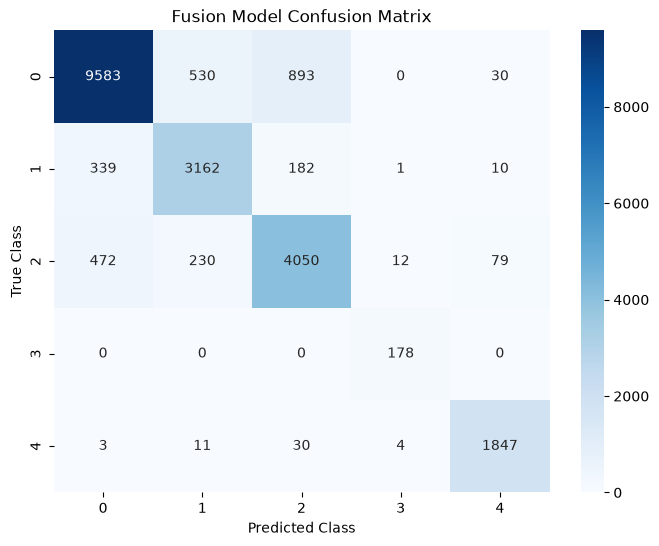

In [12]:
if os.path.exists(Config.MULTIMODAL_SAVE_PATH):
    model.load_state_dict(torch.load(Config.MULTIMODAL_SAVE_PATH))
    print("Loaded best model checkpoint for evaluation.")

model.eval()
y_true, y_pred = [], []

with torch.no_grad():
    for imgs, clins, labels in val_loader:
        imgs, clins = imgs.to(Config.DEVICE), clins.to(Config.DEVICE)
        outputs = model(imgs, clins)
        _, predicted = outputs.max(1)
        y_true.extend(labels.numpy())
        y_pred.extend(predicted.cpu().numpy())

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Calculate metrics
precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='weighted')
qwk = cohen_kappa_score(y_true, y_pred, weights='quadratic')
acc = np.mean(y_true == y_pred)

print("\n" + "="*40)
print("          FINAL EVALUATION METRICS")
print("="*40)
print(f"Accuracy:                 {acc*100:.2f}%")
print(f"Precision (Weighted):     {precision:.4f}")
print(f"Recall (Weighted):        {recall:.4f}")
print(f"F1-score (Weighted):      {f1:.4f}")
print(f"Quadratic Weighted Kappa: {qwk:.4f}")
print("="*40)

print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=[f"Class {i}" for i in range(5)]))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(5), yticklabels=range(5))
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title('Fusion Model Confusion Matrix')
plt.show()

### 13. Saliency Map Utility (Grad-CAM++)

Computes class activation maps relative to positive gradients targeting the `model.image_model.features[-1]` layer to explain visual predictions.

In [13]:
class GradCAMPlusPlus:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.handlers = []
        
        self.handlers.append(target_layer.register_forward_hook(self.save_activation))
        self.handlers.append(target_layer.register_full_backward_hook(self.save_gradient))
        
    def save_activation(self, module, input, output):
        self.activations = output
        
    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]
        
    def generate_heatmap(self, image_tensor, clinical_tensor, target_class=None):
        self.model.eval()
        with torch.enable_grad():
            output = self.model(image_tensor, clinical_tensor)
            if target_class is None:
                target_class = output.argmax(dim=1).item()
                
            self.model.zero_grad()
            score = output[0, target_class]
            score.backward()
            
        activations = self.activations.detach()
        gradients = self.gradients.detach()
        
        pos_gradients = torch.clamp(gradients, min=0.0)
        gradients_sq = pos_gradients ** 2
        gradients_cb = pos_gradients ** 3
        sum_activations = activations.sum(dim=(2, 3), keepdim=True)
        
        eps = 1e-10
        alpha_denom = 2.0 * gradients_sq + sum_activations * gradients_cb + eps
        alpha = gradients_sq / alpha_denom
        
        weights = (alpha * pos_gradients).sum(dim=(2, 3), keepdim=True)
        heatmap = (weights * activations).sum(dim=1, keepdim=True)
        heatmap = torch.clamp(heatmap, min=0.0)
        
        heatmap_min = heatmap.min()
        heatmap_max = heatmap.max()
        if heatmap_max > heatmap_min:
            heatmap = (heatmap - heatmap_min) / (heatmap_max - heatmap_min)
        else:
            heatmap = torch.zeros_like(heatmap)
            
        return heatmap.squeeze().cpu().numpy()
        
    def remove_hooks(self):
        for handler in self.handlers:
            handler.remove()

def overlay_heatmap(img_pil, heatmap, alpha=0.45):
    heatmap_resized = cv2.resize(heatmap, (img_pil.width, img_pil.height))
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
    heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)
    
    img_np = np.array(img_pil)
    blended = cv2.addWeighted(img_np, 1 - alpha, heatmap_color, alpha, 0)
    return Image.fromarray(blended)

### 14. Patient Inference Function

Note: Since raw test patient images are not preprocessed beforehand in the output directory, we process the single image on-the-fly inside the function before running model evaluation.

In [14]:
def predict_patient(raw_image_path, clinical_dict, model=None, scaler=None, encoders=None):
    """
    Runs unified multimodal inference for a single patient.
    Preprocesses the raw input image on-the-fly, then runs inference.
    """
    # Resolve default arguments dynamically to avoid NameError
    if model is None:
        model = globals().get('model')
    if scaler is None:
        scaler = globals().get('clinical_scaler')
    if encoders is None:
        encoders = globals().get('clinical_encoders')
        
    categorical_cols = globals().get('categorical_cols', [])
    numerical_cols = globals().get('numerical_cols', [])
    clinical_feature_cols = globals().get('clinical_feature_cols', [])
    train_df = globals().get('train_df', None)

    # 1. Process Tabular Patient Profile
    patient_df = pd.DataFrame([clinical_dict])
    
    # Preprocess clinical columns exactly as in training
    # Impute missing columns/values using training set statistics
    for col in categorical_cols:
        if col not in patient_df.columns or pd.isna(patient_df[col].iloc[0]):
            train_mode = train_df[col].mode()[0] if (train_df is not None and not train_df[col].empty) else 'Never'
            patient_df[col] = train_mode
            
    for col in numerical_cols:
        if col not in patient_df.columns or pd.isna(patient_df[col].iloc[0]):
            train_median = train_df[col].median() if (train_df is not None and not train_df[col].empty) else 0.0
            patient_df[col] = train_median
            
    # Encode Categorical features using the fitted encoders
    for col in categorical_cols:
        if encoders and col in encoders:
            try:
                val_str = str(patient_df[col].iloc[0])
                if val_str in encoders[col].classes_:
                    patient_df[col] = encoders[col].transform([val_str])
                else:
                    patient_df[col] = 0
            except Exception:
                patient_df[col] = 0
        else:
            patient_df[col] = 0
            
    # Normalize Numerical features using the fitted scaler
    if len(numerical_cols) > 0 and scaler is not None:
        patient_df[numerical_cols] = scaler.transform(patient_df[numerical_cols])
        
    # Align to the exact order of clinical_feature_cols used in training
    clinical_vals = patient_df[clinical_feature_cols].values.astype(np.float32)
    clinical_tensor = torch.tensor(clinical_vals, dtype=torch.float32).to(Config.DEVICE)
    
    # 2. Process Image Input on-the-fly (Raw Image -> Processed image)
    raw_img = cv2.imread(raw_image_path)
    if raw_img is None:
        raise FileNotFoundError(f"Raw image path not accessible: {raw_image_path}")
        
    # Use exact same preprocessing helper to ensure zero discrepancies
    img_resized = preprocess_image_array(raw_img, 224)
    img_rgb = cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)
    img_pil = Image.fromarray(img_rgb)
    image_tensor = val_transforms(img_pil).unsqueeze(0).to(Config.DEVICE)
    image_tensor.requires_grad = True
    
    # 3. Model Prediction
    model.eval()
    target_layer = model.image_model.features[-1]
    gcam = GradCAMPlusPlus(model, target_layer)
    
    with torch.no_grad():
        outputs = model(image_tensor, clinical_tensor)
        probs = torch.softmax(outputs, dim=1)
        confidence, predicted_idx = torch.max(probs, 1)
        
    predicted_idx = predicted_idx.item()
    confidence = confidence.item()
    
    # Generate heatmaps
    heatmap = gcam.generate_heatmap(image_tensor, clinical_tensor, target_class=predicted_idx)
    gcam.remove_hooks()
    gcam_overlay = overlay_heatmap(img_pil, heatmap, alpha=0.45)
    
    # Visualization
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    original_rgb = cv2.cvtColor(raw_img, cv2.COLOR_BGR2RGB)
    
    axes[0].imshow(original_rgb)
    axes[0].set_title("1. Raw Retina Scan")
    axes[0].axis('off')
    
    axes[1].imshow(img_pil)
    axes[1].set_title("2. Masked & Enhanced")
    axes[1].axis('off')
    
    axes[2].imshow(gcam_overlay)
    axes[2].set_title(f"3. Grad-CAM++ Saliency\n(Predicted Class: {predicted_idx} | Confidence: {confidence*100:.1f}%)")
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return predicted_idx, confidence

### 15. Run Demo Patient Inference

Demo Patient Tabular Profile:
  Gender: Female
  Smoking_Status: Former
  Hypertension: No
  Age: 59
  Duration_DM_Years: 0.3
  HbA1c: 7.1
  Fasting_Glucose_mg_dL: 156
  BMI: 26.4
  Systolic_BP: 126
  Diastolic_BP: 68
  Total_Cholesterol_mg_dL: 167
  Serum_Creatinine_mg_dL: 0.6
Demo Patient Raw Image Path: C:\Users\VICTUS\Downloads\Train_Dataset_DR\0\005b95c28852-600.jpg


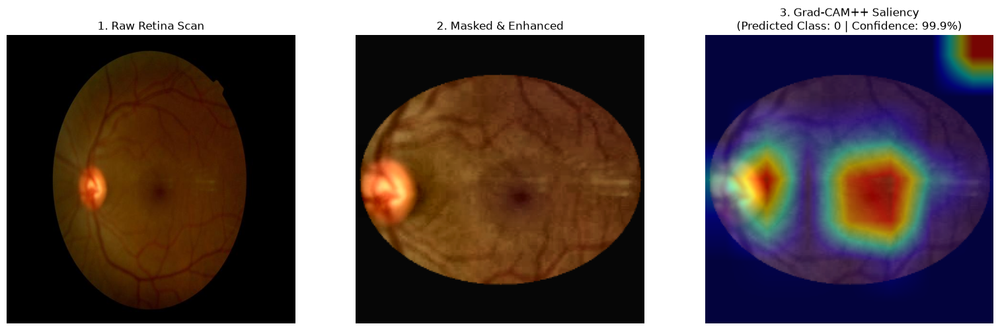

In [15]:
# Pull patient details from the validation dataset to run a demo prediction
# Note: We need a RAW image path to run predict_patient, which maps from our metadata before preprocessing path reassignment.
# Therefore we load the raw dataframe first to grab an actual raw path
raw_df_demo = pd.read_csv(Config.RAW_CLINICAL_CSV_PATH)
demo_idx = 0
demo_row = raw_df_demo.iloc[demo_idx]
demo_image_raw = demo_row['Image_Path']

# Reconstruct the original row inputs
demo_patient_profile = {}
for col in clinical_feature_cols:
    demo_patient_profile[col] = demo_row[col]

print("Demo Patient Tabular Profile:")
for k, v in demo_patient_profile.items():
    print(f"  {k}: {v}")
print(f"Demo Patient Raw Image Path: {demo_image_raw}")

# Run prediction on the raw image
predicted_class, pred_confidence = predict_patient(demo_image_raw, demo_patient_profile)


TESTING TRUE CLASS 0 - No DR
Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\0\16136_right-600.jpg
True Class: 0 - No DR

Clinical Profile:
  Gender: Male
  Smoking_Status: Former
  Hypertension: No
  Age: 57
  Duration_DM_Years: 5.8
  HbA1c: 5.6
  Fasting_Glucose_mg_dL: 70
  BMI: 30.5
  Systolic_BP: 142
  Diastolic_BP: 70
  Total_Cholesterol_mg_dL: 183
  Serum_Creatinine_mg_dL: 0.66


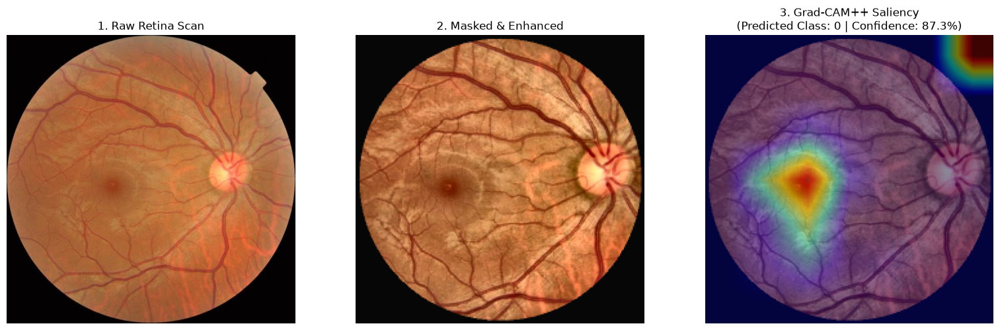


Prediction Result
----------------------------------------
True Class      : 0 (No DR)
Predicted Class : 0 (No DR)
Confidence      : 87.27%
Prediction      : CORRECT ✓

TESTING TRUE CLASS 1 - Mild DR
Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\1\20179_left-600-FA.jpg
True Class: 1 - Mild DR

Clinical Profile:
  Gender: Male
  Smoking_Status: Never
  Hypertension: No
  Age: 58
  Duration_DM_Years: 0.6
  HbA1c: 5.5
  Fasting_Glucose_mg_dL: 83
  BMI: 21.2
  Systolic_BP: 123
  Diastolic_BP: 84
  Total_Cholesterol_mg_dL: 157
  Serum_Creatinine_mg_dL: 0.85


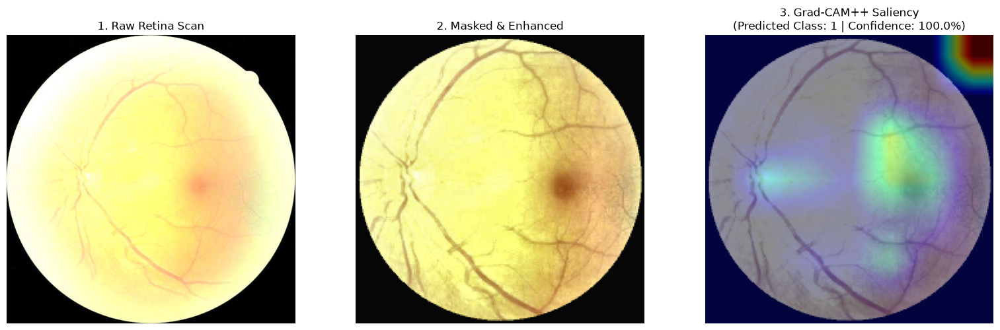


Prediction Result
----------------------------------------
True Class      : 1 (Mild DR)
Predicted Class : 1 (Mild DR)
Confidence      : 99.97%
Prediction      : CORRECT ✓

TESTING TRUE CLASS 2 - Moderate DR
Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\2\33612_left-600-ALL.jpg
True Class: 2 - Moderate DR

Clinical Profile:
  Gender: Female
  Smoking_Status: Former
  Hypertension: Yes
  Age: 36
  Duration_DM_Years: 18.2
  HbA1c: 9.0
  Fasting_Glucose_mg_dL: 187
  BMI: 32.0
  Systolic_BP: 147
  Diastolic_BP: 79
  Total_Cholesterol_mg_dL: 166
  Serum_Creatinine_mg_dL: 1.25


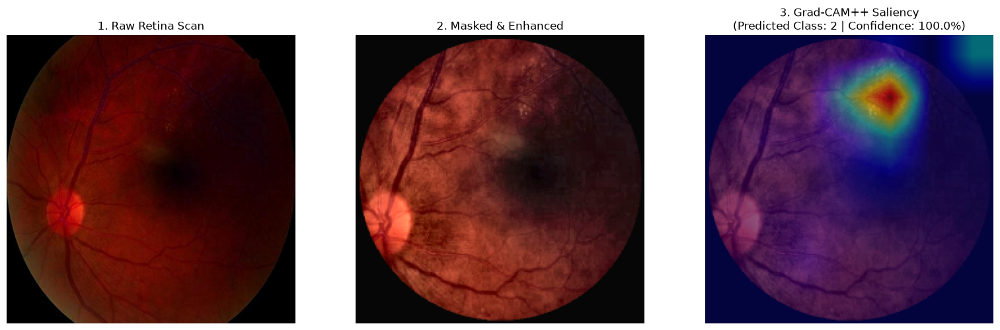


Prediction Result
----------------------------------------
True Class      : 2 (Moderate DR)
Predicted Class : 2 (Moderate DR)
Confidence      : 99.98%
Prediction      : CORRECT ✓

TESTING TRUE CLASS 3 - Severe DR
Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\3\a9e984b57556-600-FF.jpg
True Class: 3 - Severe DR

Clinical Profile:
  Gender: Male
  Smoking_Status: Never
  Hypertension: Yes
  Age: 62
  Duration_DM_Years: 18.4
  HbA1c: 7.0
  Fasting_Glucose_mg_dL: 162
  BMI: 24.4
  Systolic_BP: 159
  Diastolic_BP: 91
  Total_Cholesterol_mg_dL: 215
  Serum_Creatinine_mg_dL: 1.25


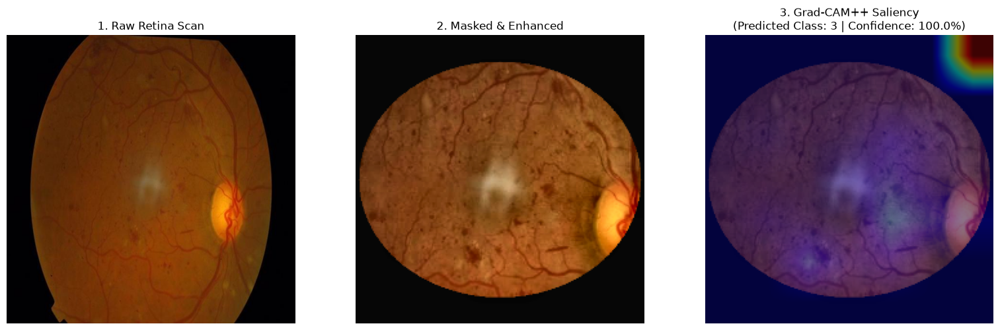


Prediction Result
----------------------------------------
True Class      : 3 (Severe DR)
Predicted Class : 3 (Severe DR)
Confidence      : 100.00%
Prediction      : CORRECT ✓

TESTING TRUE CLASS 4 - Proliferative DR
Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\4\eaa0dfbd5024-600-FA.jpg
True Class: 4 - Proliferative DR

Clinical Profile:
  Gender: Male
  Smoking_Status: Never
  Hypertension: No
  Age: 55
  Duration_DM_Years: 15.2
  HbA1c: 7.3
  Fasting_Glucose_mg_dL: 113
  BMI: 29.2
  Systolic_BP: 148
  Diastolic_BP: 68
  Total_Cholesterol_mg_dL: 192
  Serum_Creatinine_mg_dL: 1.16


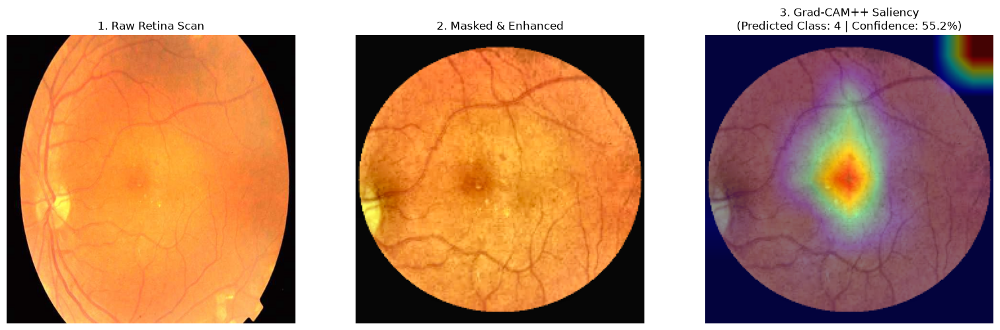


Prediction Result
----------------------------------------
True Class      : 4 (Proliferative DR)
Predicted Class : 4 (Proliferative DR)
Confidence      : 55.20%
Prediction      : CORRECT ✓


FINAL CLASS-WISE PREDICTION SUMMARY


,True_Class,True_Class_Name,Predicted_Class,Predicted_Class_Name,Confidence,Correct
0,0,No DR,0,No DR,87.272263,True
1,1,Mild DR,1,Mild DR,99.973875,True
2,2,Moderate DR,2,Moderate DR,99.977094,True
3,3,Severe DR,3,Severe DR,100.000000,True
4,4,Proliferative DR,4,Proliferative DR,55.200464,True



Class-wise Test Accuracy: 100.00%


In [16]:
# ==========================================================
# TEST ONE PATIENT FROM EACH DR CLASS (0, 1, 2, 3, 4)
# ==========================================================

raw_df_test = pd.read_csv(Config.RAW_CLINICAL_CSV_PATH)

class_names = {
    0: "No DR",
    1: "Mild DR",
    2: "Moderate DR",
    3: "Severe DR",
    4: "Proliferative DR"
}

results = []

for dr_class in range(Config.NUM_CLASSES):

    print("\n" + "=" * 70)
    print(f"TESTING TRUE CLASS {dr_class} - {class_names[dr_class]}")
    print("=" * 70)

    # Select one random patient from the current DR class
    class_df = raw_df_test[
        raw_df_test["DR_Grade"] == dr_class
    ]

    if len(class_df) == 0:
        print(f"No samples found for Class {dr_class}")
        continue

    sample_row = class_df.sample(
        n=1,
        random_state=Config.SEED + dr_class
    ).iloc[0]

    # Get raw image path
    image_path = sample_row["Image_Path"]

    # Create clinical profile
    patient_profile = {}

    for col in clinical_feature_cols:
        patient_profile[col] = sample_row[col]

    print(f"Image: {image_path}")
    print(f"True Class: {dr_class} - {class_names[dr_class]}")

    print("\nClinical Profile:")

    for key, value in patient_profile.items():
        print(f"  {key}: {value}")

    try:

        predicted_class, confidence = predict_patient(
            image_path,
            patient_profile
        )

        correct = predicted_class == dr_class

        print("\nPrediction Result")
        print("-" * 40)

        print(
            f"True Class      : {dr_class} "
            f"({class_names[dr_class]})"
        )

        print(
            f"Predicted Class : {predicted_class} "
            f"({class_names[predicted_class]})"
        )

        print(
            f"Confidence      : {confidence * 100:.2f}%"
        )

        print(
            f"Prediction      : {'CORRECT ✓' if correct else 'WRONG ✗'}"
        )

        results.append({
            "True_Class": dr_class,
            "True_Class_Name": class_names[dr_class],
            "Predicted_Class": predicted_class,
            "Predicted_Class_Name": class_names[predicted_class],
            "Confidence": confidence * 100,
            "Correct": correct
        })

    except Exception as e:

        print(
            f"Error while testing Class {dr_class}: {e}"
        )


# FINAL SUMMARY
results_df = pd.DataFrame(results)

print("\n")
print("=" * 70)
print("FINAL CLASS-WISE PREDICTION SUMMARY")
print("=" * 70)

display(results_df)

if len(results_df) > 0:

    test_accuracy = results_df["Correct"].mean() * 100

    print(
        f"\nClass-wise Test Accuracy: "
        f"{test_accuracy:.2f}%"
    )

TESTING NEW RANDOM SAMPLES FROM EACH DR CLASS

TRUE CLASS 0 - No DR | NEW SAMPLE 1

Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\0\21395_left-600.jpg
True Class: 0 (No DR)

Clinical Profile:
  Gender: Female
  Smoking_Status: Never
  Hypertension: No
  Age: 63
  Duration_DM_Years: 4.7
  HbA1c: 7.0
  Fasting_Glucose_mg_dL: 120
  BMI: 34.6
  Systolic_BP: 137
  Diastolic_BP: 73
  Total_Cholesterol_mg_dL: 152
  Serum_Creatinine_mg_dL: 1.01


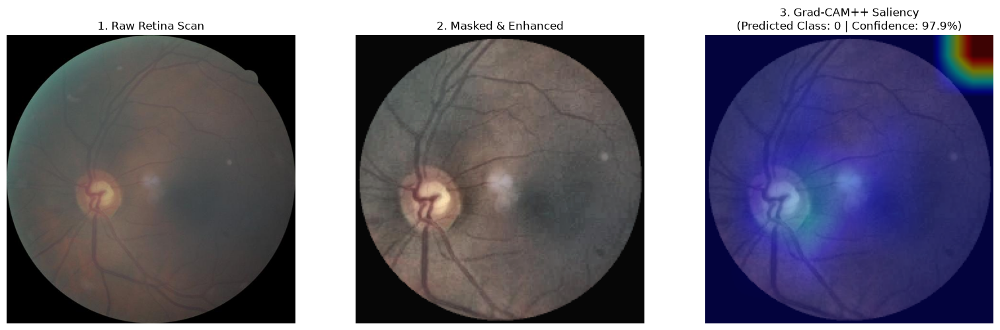


Prediction Result
---------------------------------------------
True Class      : 0 (No DR)
Predicted Class : 0 (No DR)
Confidence      : 97.94%
Prediction      : CORRECT ✓

TRUE CLASS 0 - No DR | NEW SAMPLE 2

Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\0\26885_left-600.jpg
True Class: 0 (No DR)

Clinical Profile:
  Gender: Male
  Smoking_Status: Never
  Hypertension: No
  Age: 58
  Duration_DM_Years: 5.2
  HbA1c: 6.5
  Fasting_Glucose_mg_dL: 139
  BMI: 35.5
  Systolic_BP: 141
  Diastolic_BP: 89
  Total_Cholesterol_mg_dL: 189
  Serum_Creatinine_mg_dL: 0.5


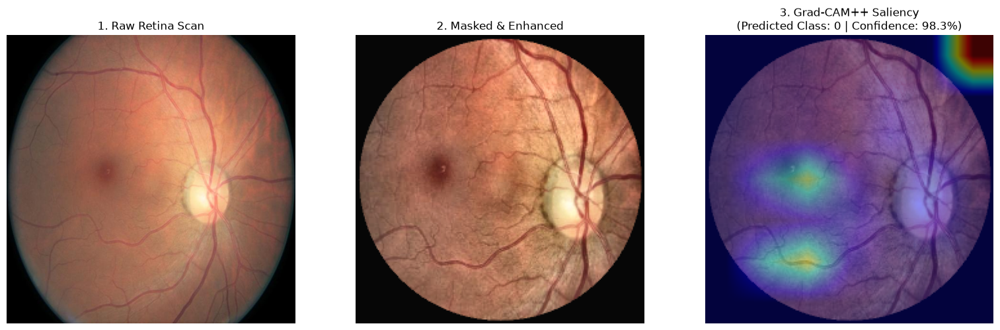


Prediction Result
---------------------------------------------
True Class      : 0 (No DR)
Predicted Class : 0 (No DR)
Confidence      : 98.33%
Prediction      : CORRECT ✓

TRUE CLASS 0 - No DR | NEW SAMPLE 3

Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\0\3411_left-600.jpg
True Class: 0 (No DR)

Clinical Profile:
  Gender: Male
  Smoking_Status: Never
  Hypertension: No
  Age: 54
  Duration_DM_Years: 10.5
  HbA1c: 6.4
  Fasting_Glucose_mg_dL: 129
  BMI: 28.2
  Systolic_BP: 137
  Diastolic_BP: 75
  Total_Cholesterol_mg_dL: 129
  Serum_Creatinine_mg_dL: 0.87


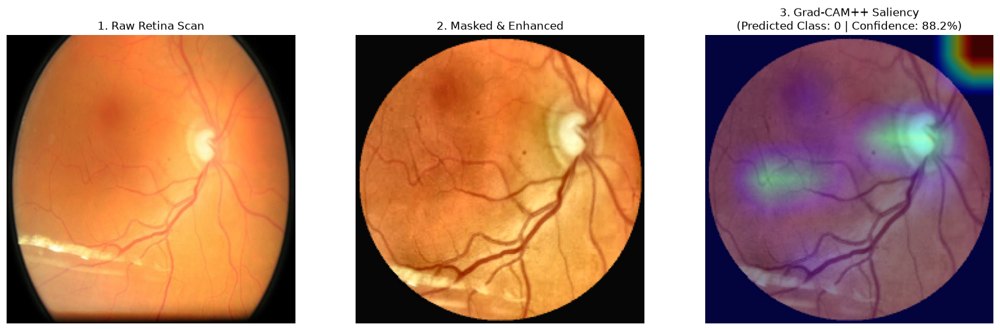


Prediction Result
---------------------------------------------
True Class      : 0 (No DR)
Predicted Class : 0 (No DR)
Confidence      : 88.20%
Prediction      : CORRECT ✓

TRUE CLASS 1 - Mild DR | NEW SAMPLE 1

Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\1\a28bfb772f50-GF-600-HFF.jpg
True Class: 1 (Mild DR)

Clinical Profile:
  Gender: Female
  Smoking_Status: Current
  Hypertension: No
  Age: 45
  Duration_DM_Years: 6.9
  HbA1c: 5.8
  Fasting_Glucose_mg_dL: 122
  BMI: 21.9
  Systolic_BP: 137
  Diastolic_BP: 80
  Total_Cholesterol_mg_dL: 166
  Serum_Creatinine_mg_dL: 0.81


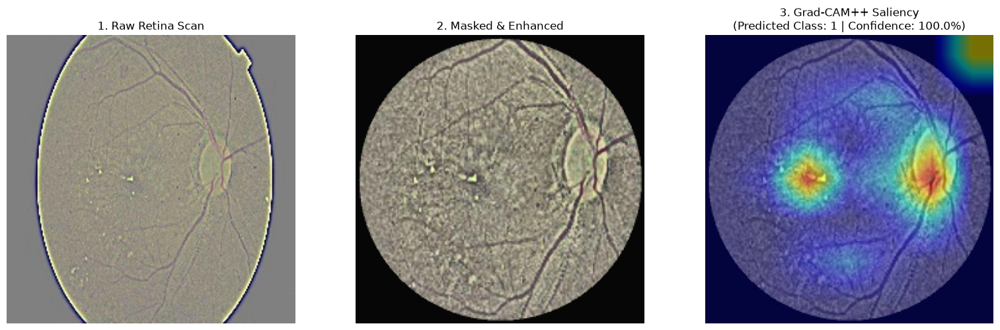


Prediction Result
---------------------------------------------
True Class      : 1 (Mild DR)
Predicted Class : 1 (Mild DR)
Confidence      : 100.00%
Prediction      : CORRECT ✓

TRUE CLASS 1 - Mild DR | NEW SAMPLE 2

Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\1\14467_right-600-HFF.jpg
True Class: 1 (Mild DR)

Clinical Profile:
  Gender: Male
  Smoking_Status: Former
  Hypertension: Yes
  Age: 64
  Duration_DM_Years: 10.9
  HbA1c: 6.7
  Fasting_Glucose_mg_dL: 134
  BMI: 29.7
  Systolic_BP: 152
  Diastolic_BP: 68
  Total_Cholesterol_mg_dL: 151
  Serum_Creatinine_mg_dL: 0.84


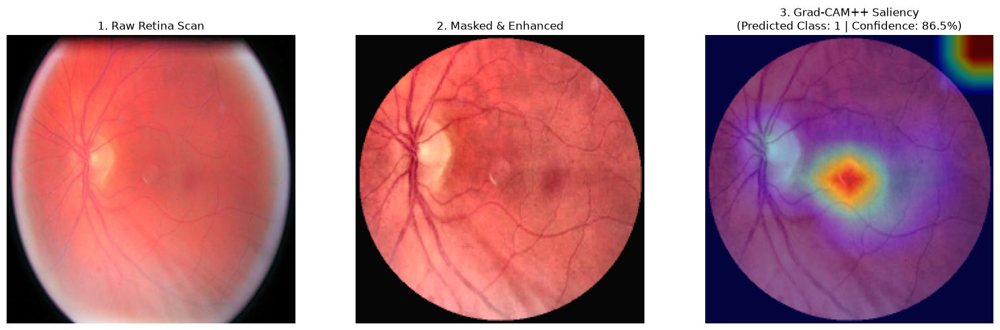


Prediction Result
---------------------------------------------
True Class      : 1 (Mild DR)
Predicted Class : 1 (Mild DR)
Confidence      : 86.50%
Prediction      : CORRECT ✓

TRUE CLASS 1 - Mild DR | NEW SAMPLE 3

Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\1\8821_right-600-HB.jpg
True Class: 1 (Mild DR)

Clinical Profile:
  Gender: Male
  Smoking_Status: Never
  Hypertension: No
  Age: 33
  Duration_DM_Years: 17.8
  HbA1c: 6.3
  Fasting_Glucose_mg_dL: 78
  BMI: 29.2
  Systolic_BP: 145
  Diastolic_BP: 64
  Total_Cholesterol_mg_dL: 156
  Serum_Creatinine_mg_dL: 0.84


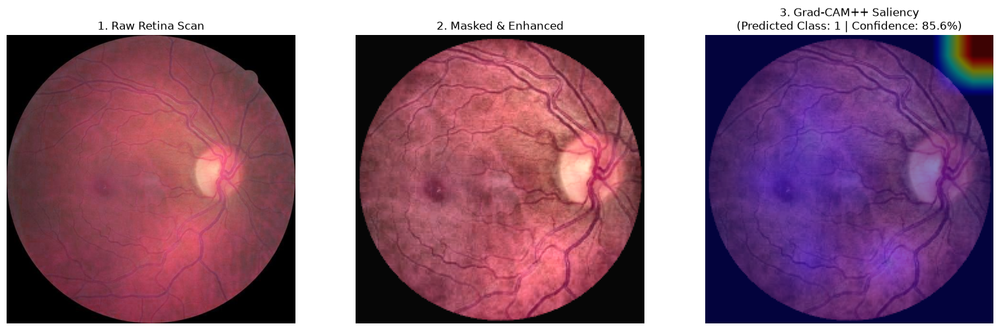


Prediction Result
---------------------------------------------
True Class      : 1 (Mild DR)
Predicted Class : 1 (Mild DR)
Confidence      : 85.60%
Prediction      : CORRECT ✓

TRUE CLASS 2 - Moderate DR | NEW SAMPLE 1

Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\2\b0eeae01b8ab-GF-600-ALL.jpg
True Class: 2 (Moderate DR)

Clinical Profile:
  Gender: Female
  Smoking_Status: Never
  Hypertension: No
  Age: 54
  Duration_DM_Years: 2.4
  HbA1c: 7.4
  Fasting_Glucose_mg_dL: 141
  BMI: 22.8
  Systolic_BP: 155
  Diastolic_BP: 66
  Total_Cholesterol_mg_dL: 146
  Serum_Creatinine_mg_dL: 1.06


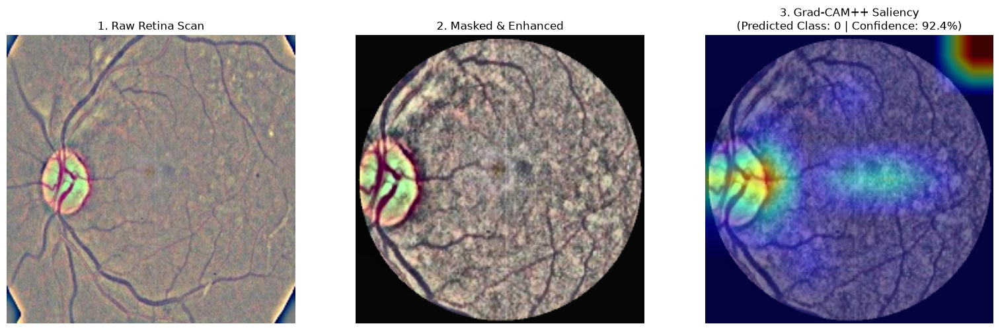


Prediction Result
---------------------------------------------
True Class      : 2 (Moderate DR)
Predicted Class : 0 (No DR)
Confidence      : 92.41%
Prediction      : WRONG ✗

TRUE CLASS 2 - Moderate DR | NEW SAMPLE 2

Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\2\2536_left-600.jpg
True Class: 2 (Moderate DR)

Clinical Profile:
  Gender: Male
  Smoking_Status: Current
  Hypertension: Yes
  Age: 46
  Duration_DM_Years: 23.3
  HbA1c: 7.8
  Fasting_Glucose_mg_dL: 135
  BMI: 28.5
  Systolic_BP: 120
  Diastolic_BP: 83
  Total_Cholesterol_mg_dL: 182
  Serum_Creatinine_mg_dL: 0.92


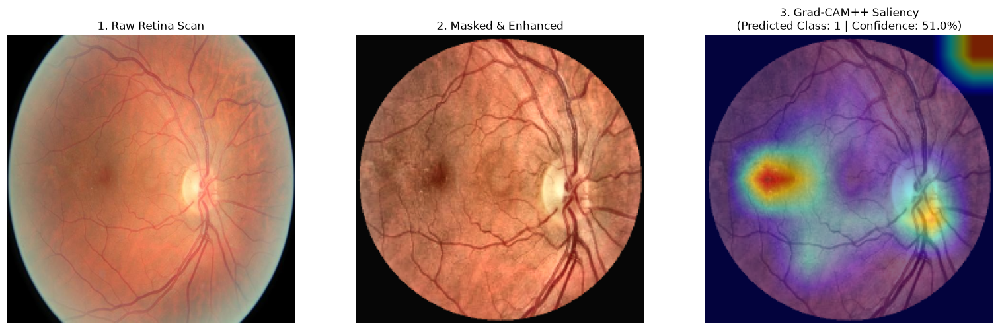


Prediction Result
---------------------------------------------
True Class      : 2 (Moderate DR)
Predicted Class : 1 (Mild DR)
Confidence      : 50.97%
Prediction      : WRONG ✗

TRUE CLASS 2 - Moderate DR | NEW SAMPLE 3

Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\2\14688_right-600-ALL.jpg
True Class: 2 (Moderate DR)

Clinical Profile:
  Gender: Male
  Smoking_Status: Never
  Hypertension: No
  Age: 70
  Duration_DM_Years: 8.9
  HbA1c: 7.2
  Fasting_Glucose_mg_dL: 180
  BMI: 30.6
  Systolic_BP: 142
  Diastolic_BP: 80
  Total_Cholesterol_mg_dL: 153
  Serum_Creatinine_mg_dL: 1.32


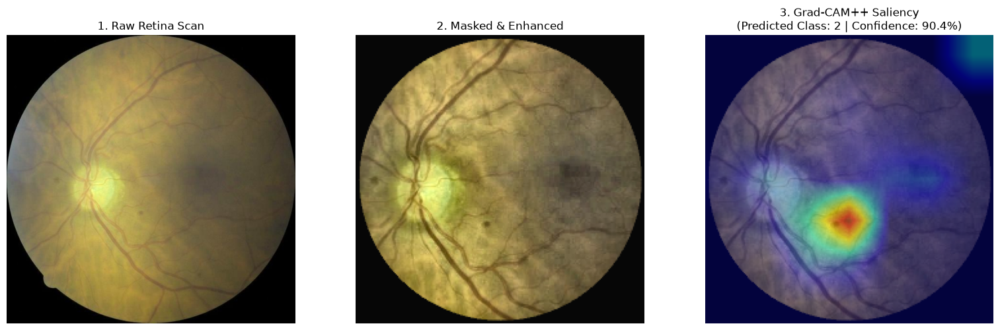


Prediction Result
---------------------------------------------
True Class      : 2 (Moderate DR)
Predicted Class : 2 (Moderate DR)
Confidence      : 90.41%
Prediction      : CORRECT ✓

TRUE CLASS 3 - Severe DR | NEW SAMPLE 1

Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\3\dd3dad6ca78f-600-BF.jpg
True Class: 3 (Severe DR)

Clinical Profile:
  Gender: Female
  Smoking_Status: Current
  Hypertension: No
  Age: 46
  Duration_DM_Years: 18.6
  HbA1c: 7.5
  Fasting_Glucose_mg_dL: 110
  BMI: 30.6
  Systolic_BP: 148
  Diastolic_BP: 71
  Total_Cholesterol_mg_dL: 217
  Serum_Creatinine_mg_dL: 0.9


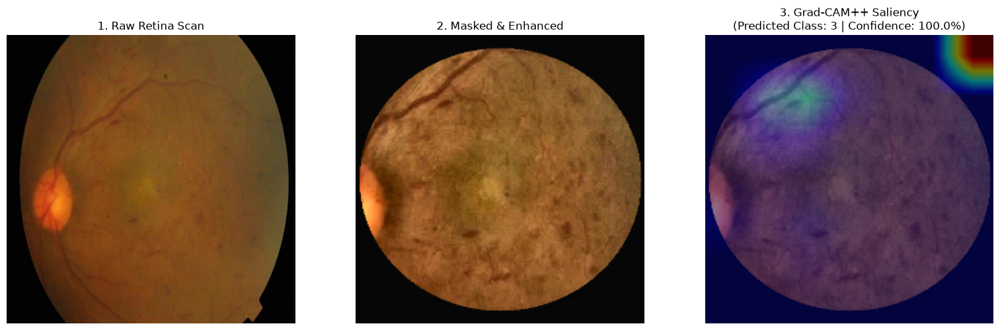


Prediction Result
---------------------------------------------
True Class      : 3 (Severe DR)
Predicted Class : 3 (Severe DR)
Confidence      : 100.00%
Prediction      : CORRECT ✓

TRUE CLASS 3 - Severe DR | NEW SAMPLE 2

Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\3\fb61230b99dd-600-SF.jpg
True Class: 3 (Severe DR)

Clinical Profile:
  Gender: Male
  Smoking_Status: Never
  Hypertension: No
  Age: 59
  Duration_DM_Years: 10.7
  HbA1c: 7.1
  Fasting_Glucose_mg_dL: 79
  BMI: 24.4
  Systolic_BP: 143
  Diastolic_BP: 81
  Total_Cholesterol_mg_dL: 187
  Serum_Creatinine_mg_dL: 1.14


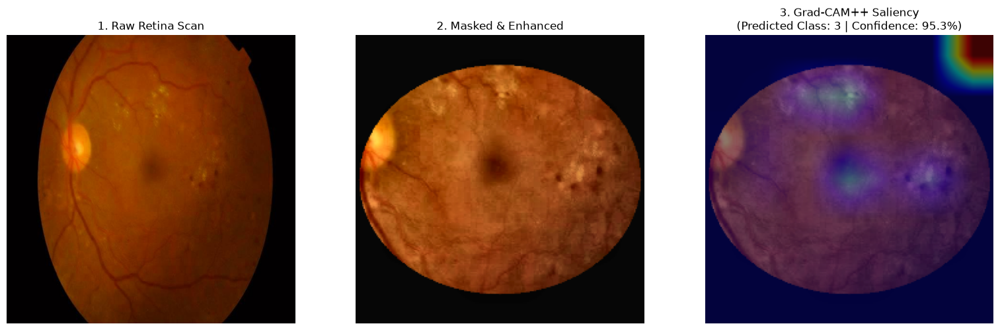


Prediction Result
---------------------------------------------
True Class      : 3 (Severe DR)
Predicted Class : 3 (Severe DR)
Confidence      : 95.27%
Prediction      : CORRECT ✓

TRUE CLASS 3 - Severe DR | NEW SAMPLE 3

Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\3\fda39982a810-600-SF.jpg
True Class: 3 (Severe DR)

Clinical Profile:
  Gender: Female
  Smoking_Status: Never
  Hypertension: No
  Age: 42
  Duration_DM_Years: 9.5
  HbA1c: 7.3
  Fasting_Glucose_mg_dL: 159
  BMI: 20.5
  Systolic_BP: 107
  Diastolic_BP: 69
  Total_Cholesterol_mg_dL: 159
  Serum_Creatinine_mg_dL: 0.68


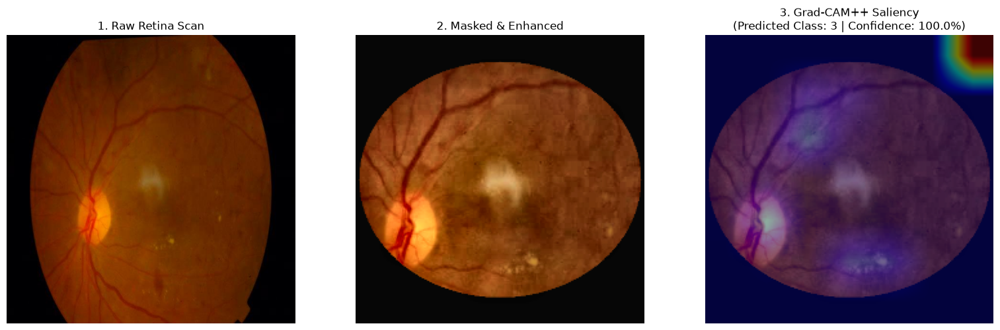


Prediction Result
---------------------------------------------
True Class      : 3 (Severe DR)
Predicted Class : 3 (Severe DR)
Confidence      : 100.00%
Prediction      : CORRECT ✓

TRUE CLASS 4 - Proliferative DR | NEW SAMPLE 1

Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\4\35461_right-600-FS.jpg
True Class: 4 (Proliferative DR)

Clinical Profile:
  Gender: Male
  Smoking_Status: Former
  Hypertension: No
  Age: 48
  Duration_DM_Years: 13.8
  HbA1c: 5.4
  Fasting_Glucose_mg_dL: 100
  BMI: 36.1
  Systolic_BP: 146
  Diastolic_BP: 71
  Total_Cholesterol_mg_dL: 155
  Serum_Creatinine_mg_dL: 1.39


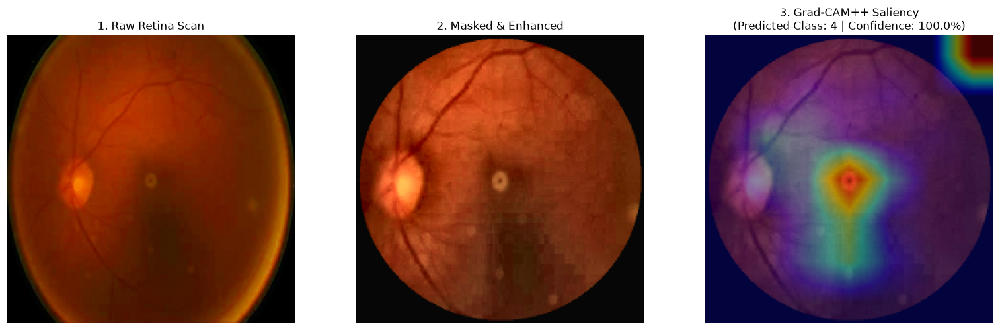


Prediction Result
---------------------------------------------
True Class      : 4 (Proliferative DR)
Predicted Class : 4 (Proliferative DR)
Confidence      : 100.00%
Prediction      : CORRECT ✓

TRUE CLASS 4 - Proliferative DR | NEW SAMPLE 2

Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\4\43905_right-600.jpg
True Class: 4 (Proliferative DR)

Clinical Profile:
  Gender: Male
  Smoking_Status: Never
  Hypertension: Yes
  Age: 61
  Duration_DM_Years: 8.8
  HbA1c: 8.0
  Fasting_Glucose_mg_dL: 163
  BMI: 23.2
  Systolic_BP: 169
  Diastolic_BP: 88
  Total_Cholesterol_mg_dL: 197
  Serum_Creatinine_mg_dL: 0.86


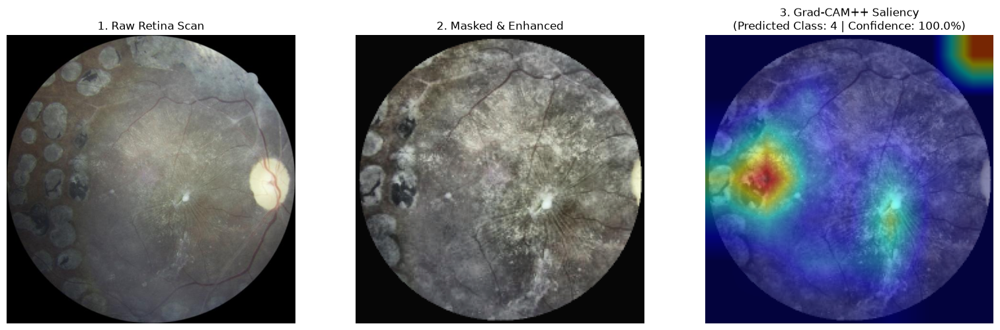


Prediction Result
---------------------------------------------
True Class      : 4 (Proliferative DR)
Predicted Class : 4 (Proliferative DR)
Confidence      : 100.00%
Prediction      : CORRECT ✓

TRUE CLASS 4 - Proliferative DR | NEW SAMPLE 3

Image: C:\Users\VICTUS\Downloads\Train_Dataset_DR\4\34807_left-600-HB.jpg
True Class: 4 (Proliferative DR)

Clinical Profile:
  Gender: Female
  Smoking_Status: Never
  Hypertension: Yes
  Age: 40
  Duration_DM_Years: 18.8
  HbA1c: 6.1
  Fasting_Glucose_mg_dL: 115
  BMI: 29.8
  Systolic_BP: 155
  Diastolic_BP: 85
  Total_Cholesterol_mg_dL: 228
  Serum_Creatinine_mg_dL: 1.13


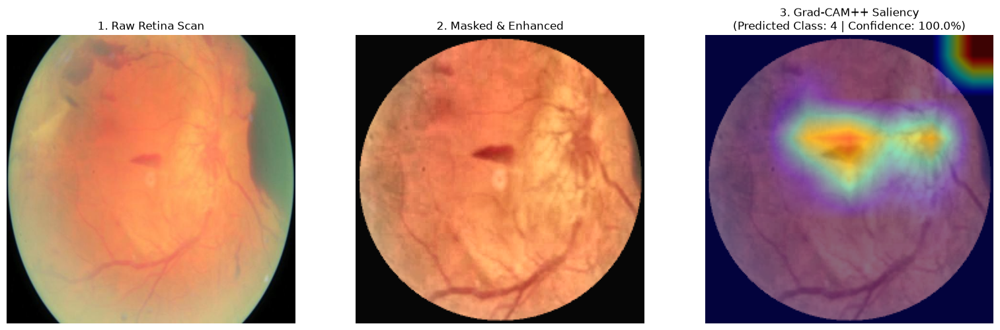


Prediction Result
---------------------------------------------
True Class      : 4 (Proliferative DR)
Predicted Class : 4 (Proliferative DR)
Confidence      : 100.00%
Prediction      : CORRECT ✓


NEW RANDOM SAMPLE TEST SUMMARY


,True Class,True Class Name,Predicted Class,Predicted Class Name,Confidence,Correct
0,0,No DR,0,No DR,97.936332,True
1,0,No DR,0,No DR,98.332340,True
2,0,No DR,0,No DR,88.203955,True
3,1,Mild DR,1,Mild DR,99.997592,True
4,1,Mild DR,1,Mild DR,86.504340,True
5,1,Mild DR,1,Mild DR,85.601449,True
6,2,Moderate DR,0,No DR,92.408073,False
7,2,Moderate DR,1,Mild DR,50.974602,False
8,2,Moderate DR,2,Moderate DR,90.407401,True
9,3,Severe DR,3,Severe DR,100.000000,True



Random Sample Test Accuracy: 86.67%

Class-wise Accuracy:
Class 0 (No DR): 100.00%
Class 1 (Mild DR): 100.00%
Class 2 (Moderate DR): 33.33%
Class 3 (Severe DR): 100.00%
Class 4 (Proliferative DR): 100.00%


In [17]:
# ==========================================================
# TEST MORE RANDOM SAMPLES FROM DIFFERENT DR CLASSES
# Excludes the first sample from each class
# ==========================================================

import pandas as pd
import numpy as np
import random

# Class names
CLASS_NAMES = {
    0: "No DR",
    1: "Mild DR",
    2: "Moderate DR",
    3: "Severe DR",
    4: "Proliferative DR"
}

# Load RAW clinical dataset
test_df = pd.read_csv(Config.RAW_CLINICAL_CSV_PATH)

# Random seed different from previous testing
random.seed(123)
np.random.seed(123)

# Store results
new_test_results = []

# Number of NEW samples per class
SAMPLES_PER_CLASS = 3

print("=" * 70)
print("TESTING NEW RANDOM SAMPLES FROM EACH DR CLASS")
print("=" * 70)

for true_class in range(Config.NUM_CLASSES):

    class_df = test_df[
        test_df["DR_Grade"] == true_class
    ].reset_index(drop=True)

    # Exclude first sample because previous test may have used it
    if len(class_df) > 1:
        class_df = class_df.iloc[1:].reset_index(drop=True)

    # Randomly choose NEW samples
    num_samples = min(SAMPLES_PER_CLASS, len(class_df))

    selected_samples = class_df.sample(
        n=num_samples,
        random_state=123 + true_class
    )

    for sample_no, (_, row) in enumerate(
        selected_samples.iterrows(), start=1
    ):

        print("\n" + "=" * 70)
        print(
            f"TRUE CLASS {true_class} - "
            f"{CLASS_NAMES[true_class]} | "
            f"NEW SAMPLE {sample_no}"
        )
        print("=" * 70)

        image_path = row["Image_Path"]

        # Build clinical profile
        clinical_profile = {}

        for col in clinical_feature_cols:
            if col in row.index:
                clinical_profile[col] = row[col]

        print(f"\nImage: {image_path}")
        print(
            f"True Class: {true_class} "
            f"({CLASS_NAMES[true_class]})"
        )

        print("\nClinical Profile:")

        for key, value in clinical_profile.items():
            print(f"  {key}: {value}")

        try:

            # Run prediction + Grad-CAM++
            predicted_class, confidence = predict_patient(
                image_path,
                clinical_profile
            )

            correct = predicted_class == true_class

            print("\nPrediction Result")
            print("-" * 45)

            print(
                f"True Class      : {true_class} "
                f"({CLASS_NAMES[true_class]})"
            )

            print(
                f"Predicted Class : {predicted_class} "
                f"({CLASS_NAMES[predicted_class]})"
            )

            print(
                f"Confidence      : {confidence * 100:.2f}%"
            )

            print(
                f"Prediction      : "
                f"{'CORRECT ✓' if correct else 'WRONG ✗'}"
            )

            # Save result
            new_test_results.append({

                "True Class": true_class,

                "True Class Name":
                    CLASS_NAMES[true_class],

                "Predicted Class":
                    predicted_class,

                "Predicted Class Name":
                    CLASS_NAMES[predicted_class],

                "Confidence":
                    confidence * 100,

                "Correct":
                    correct,

                "Image Path":
                    image_path
            })

        except Exception as e:

            print(f"\nERROR processing sample: {e}")


# ==========================================================
# FINAL RESULTS
# ==========================================================

results_df = pd.DataFrame(new_test_results)

print("\n\n" + "=" * 70)
print("NEW RANDOM SAMPLE TEST SUMMARY")
print("=" * 70)

display(results_df[
    [
        "True Class",
        "True Class Name",
        "Predicted Class",
        "Predicted Class Name",
        "Confidence",
        "Correct"
    ]
])


if len(results_df) > 0:

    accuracy = results_df["Correct"].mean() * 100

    print(
        f"\nRandom Sample Test Accuracy: "
        f"{accuracy:.2f}%"
    )

    print("\nClass-wise Accuracy:")

    class_accuracy = results_df.groupby(
        "True Class"
    )["Correct"].mean() * 100

    for class_id, acc in class_accuracy.items():

        print(
            f"Class {class_id} "
            f"({CLASS_NAMES[class_id]}): "
            f"{acc:.2f}%"
        )